In [1]:
import sys
import xarray as xr
import numpy as np
import geopandas as gpd
from IPython.display import Image
import matplotlib.pyplot as plt
from odc.geo.xr import assign_crs
sys.path.append('/g/data/os22/chad_tmp/dea-notebooks/Tools')
from dea_tools.plotting import xr_animation

In [42]:
# path='/g/data/os22/chad_tmp/NEE_modelling/data/FLUXCOM/nee_rs_meteo_era5.nc'
path='/g/data/os22/chad_tmp/NEE_modelling/results/predictions/NEE_modelled_2003_2021.nc'
var='NEE'
export='mystudy'

In [43]:
# ds = assign_crs(xr.open_dataarray(path), crs='epsg:4326')
ds = assign_crs(xr.open_dataset(path).sel(time=slice('2003', '2018')), crs='epsg:4326')
ds

if export == 'fluxcom':
    ds = ds*30 #/day to /month'

# #convert to Total Carbon/month
# area_per_pixel = ds.geobox.resolution[1]**2
# ds = ds * area_per_pixel

In [44]:
# poly_gdf = gpd.read_file('/g/data/os22/chad_tmp/NEE_modelling/data/aus_outline/AUS_2021_AUST_GDA2020.shp')
# poly_gdf =  poly_gdf[poly_gdf['AUS_CODE21']=='AUS']

Exporting animation to /g/data/os22/chad_tmp/NEE_modelling/results/figs/NEE_mystudy.gif


  0%|          | 0/192 (0.0 seconds remaining at ? frames/s)

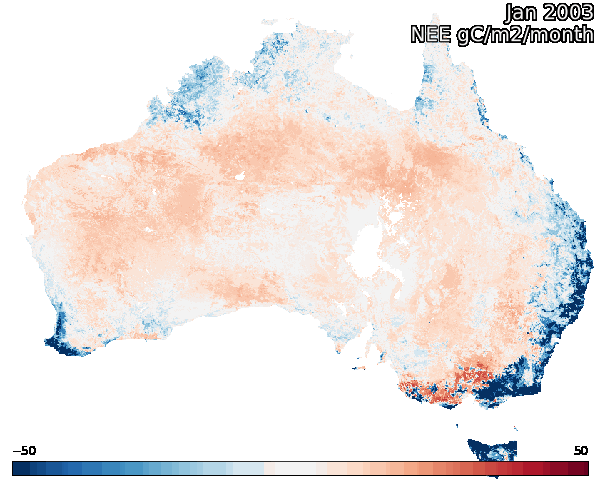

In [45]:
path = '/g/data/os22/chad_tmp/NEE_modelling/results/figs/NEE_'+export+'.gif'

# poly_gdf['color'] = 'None'
# ds.attrs['nodata'] = np.nan

xr_animation(ds,
            bands=[var],
            show_date='%b %Y',
            width_pixels=600,
            output_path=path,
            show_colorbar=True,
            colorbar_kwargs={'colors': 'black'},
            # show_gdf=poly_gdf,
            interval=200, 
            show_text=var+' gC/m2/month',
            # gdf_kwargs={'edgecolor': 'grey', 'linewidth':0.5}, 
            imshow_kwargs={'cmap': 'RdBu_r','vmin': -50, 'vmax': 50}#
            )

# Plot animation
plt.close()
Image(path, embed=True)